# SEGMENTACION MEDIANTE ensamble de 3 U-NET+
TL (Transfer Learning)
* A) UNET+VGG16: TL VGG16 y Drop out 0.5 y regulac L2
* B) UNET+Resnet50: TL Resnet50
* C) UNET+Resnet152: TL Resnet152

Entrenados con función de pérdida **dice_loss**  

  dice_score = (2.0 * intersection + smooth) / (suma + smooth)

   
  dice_loss = 1.0 - dice_score

  donde smooth= 1 o 1e-5 ( 1o 1e-5 para VGG16, 1 para Resnet50 y 1e-5 para Resnet 152)

Aumentación A: 2 Traslaciones (i=0, j=-2,2) y 4Flip (493*4*2=3940 imágenes)

Aumentación B:  5 Traslaciones (i=0, j=-4,-2,0,2,4) y 4Flip (493*4*5=9860 imágenes)

Aumentación C:  Traslaciones ( i=-4,4, j=-4,0.4) y 4Flip (493*4*6 = 11832 imágenes)


## Content Drive

In [1]:
# Este comando es para leer los archivos directamente desde Drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


## path modelo e imágenes

In [2]:
carpeta_modelo='ensamble_final/'
carpeta_modelo1='VGG16/'
carpeta_modelo2='Resnet50/'
carpeta_modelo3='Resnet152/'
#carpeta_modelo1='VGG16_1/'
#carpeta_modelo2='VGG16_1/'
#carpeta_modelo3='VGG16_2/'
path_resultados='/content/drive/MyDrive/Proyecto_Sadosky/modelo_final/resultados/'
path_resultados = "/content/drive/MyDrive/Sadosky_EcoDoppler/Investigación/Procesamiento/modelo_final/resultados/"
path_modelo=path_resultados+carpeta_modelo
path_modelo1=path_resultados+carpeta_modelo1
path_modelo2=path_resultados+carpeta_modelo2
path_modelo3=path_resultados+carpeta_modelo3

In [3]:
path_train = "/content/drive/MyDrive/Proyecto_Sadosky/base_final/clean_database/train"
path_test = "/content/drive/MyDrive/Proyecto_Sadosky/base_final/clean_database/test"

In [4]:
path_train = "/content/drive/MyDrive/Sadosky_EcoDoppler/Investigación/Procesamiento/base_final/clean_database/train"
path_test = "/content/drive/MyDrive/Sadosky_EcoDoppler/Investigación/Procesamiento/base_final/clean_database/test"

##  Codigo

In [5]:
## Imports
import os
import random

import numpy as np
import cv2
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras


## Seeding
seed = 2019
random.seed = seed
np.random.seed = seed
tf.seed = seed

## Metricas para medir el desempeno de la red

In [6]:
def jacard_coef_np(y_true, y_pred):
  y_true=y_true.astype('float32')
  y_pred=y_pred.astype('float32')
  intersection = np.sum(y_true * y_pred)
  return (intersection + 1.0) / (np.sum(y_true) + np.sum(y_pred) - intersection + 1.0)

In [7]:
def dice_coef_np(y_true, y_pred):
  y_true=y_true.astype('float32')
  y_pred=y_pred.astype('float32')
  intersection = np.sum(y_true * y_pred)
  return (2*intersection + 1.0) / (np.sum(y_true) + np.sum(y_pred) + 1.0)

In [8]:
import tensorflow.keras.backend as K

# intersection over union

def jacard_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    intersection = K.sum(y_true * y_pred)

    return (intersection + 1.0) / (K.sum(y_true) + K.sum(y_pred) - intersection + 1.0)

def jacard_coef_loss(y_true, y_pred):
    return -jacard_coef(y_true, y_pred)

In [9]:
import tensorflow.keras.backend as K

def dice_coefficient(y_true, y_pred, smooth=1):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred)
    dice = (2.0 * intersection + smooth) / (union + smooth)
    return dice

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

In [10]:
import tensorflow as tf

def dice_loss(y_true, y_pred, smooth=1e-5):
    y_true = tf.cast(y_true, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice_score = (2.0 * intersection + smooth) / (union + smooth)
    dice_loss = 1.0 - dice_score
    return dice_loss

In [11]:
import tensorflow as tf
# este no funciona bien para smooth=1e-5, pasan cosas locas

def dice_loss_modif(y_true, y_pred, smooth=1): #smooth=1e-6
    y_true = tf.cast(y_true, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice_score = (2.0 * intersection + smooth) / (union + smooth)
    dice_loss = - dice_score+(tf.reduce_sum(y_pred)*smooth)**2
    return dice_loss

### Funciones para cálculo de Coeficientes, para test o Train

In [12]:
def calc_coefs_Jaccard(Y,pred):
  dim=pred.shape
  #print(dim)
  #print(len(dim))
  n=dim[0]
  if len(dim)==3:
    Coefs=np.zeros(n)
    for item in range(n):
      Coefs[item]=jacard_coef_np(Y[item], pred[item])
  else:
    k=dim[3]
    Coefs=np.zeros((n,k))
    for item in range(n):
      for i in range(k):
        Coefs[item,i]=jacard_coef_np(Y[item], pred[item,:,:,i])

  return Coefs

In [13]:
def calc_coefs_DICE(Y,pred):
  dim=pred.shape
  n=dim[0]
  #print(dim)
  #print(len(dim))
  if len(dim)==3:
    Coefs=np.zeros(n)
    for item in range(n):
      Coefs[item]=dice_coef_np(Y[item], pred[item])
  else:
    k=dim[3]
    Coefs=np.zeros((n,k))
    for item in range(n):
      for i in range(k):
        Coefs[item,i]=dice_coef_np(Y[item], pred[item,:,:,i])

  return Coefs

### comparación y visualización de imágenes

In [14]:
def image_comparac(monocroma, etiqueta, red): #para un modelo
    # input: image and mask filepath and the index
    # output matplotlib images

    fig, ax = plt.subplots(1,4,figsize=(16,4)) #cambié para que se vean horizontales
    ax[0].imshow(monocroma, aspect='auto', cmap='gray')
    ax[0].set_title('monocroma')
    ax[1].imshow(etiqueta, aspect='auto', cmap='gray')
    ax[1].set_title('Ground Truth')
    ax[2].set_title('Predicción')
    ax[2].imshow(red, aspect='auto', cmap = 'gray')
    ax[3].imshow(monocroma, aspect='auto', cmap='gray')
    ax[3].imshow(etiqueta, cmap = 'Reds', aspect='auto', alpha = 0.4)
    ax[3].imshow(red, cmap = 'Blues', aspect='auto', alpha = 0.4)

In [15]:
def model_comparac(monocroma, etiqueta, red1, red2,red3, red4, ensamble): #para 4 modelo y ensamble
    # input: image and mask filepath and the index
    # output matplotlib images

    fig, ax = plt.subplots(2,4,figsize=(16,8)) #cambié para que se vean horizontales
    ax[0,0].imshow(monocroma, aspect='auto', cmap='gray')
    ax[0,0].set_title('monocroma')
    ax[0,1].imshow(etiqueta, aspect='auto', cmap='gray')
    ax[0,1].set_title('Ground Truth')

    ax[0,2].set_title('Pred.'+carpeta_modelo1)
    ax[0,2].imshow(red1, aspect='auto', cmap = 'gray')
    ax[0,3].set_title('Pred. '+carpeta_modelo2)
    ax[0,3].imshow(red2, aspect='auto', cmap = 'gray')
    ax[1,2].set_title('Pred. '+carpeta_modelo3)
    ax[1,2].imshow(red3, aspect='auto', cmap = 'gray')

    ax[1,3].set_title('Pred. '+carpeta_modelo4)
    ax[1,3].imshow(red4, aspect='auto', cmap = 'gray')

    ax[1,1].set_title('Ensamble')
    ax[1,1].imshow(ensamble, aspect='auto', cmap = 'gray')

    ax[1,0].imshow(monocroma, aspect='auto', cmap='gray')
    ax[1,0].imshow(etiqueta, cmap = 'Reds', aspect='auto', alpha = 0.5)
    ax[1,0].imshow(ensamble, cmap = 'Blues', aspect='auto', alpha = 0.5)

In [16]:
def model_comparac_3(monocroma, etiqueta, red1, red2,red3, ensamble,titulo=''):  #para 3 modelo3 y ensamble
    # input: image and mask filepath and the index
    # output matplotlib images

    fig, ax = plt.subplots(2,3,figsize=(14,8)) #cambié para que se vean horizontales
    ax[0,0].imshow(monocroma, aspect='auto', cmap='gray')
    ax[0,0].imshow(etiqueta, cmap = 'Reds', aspect='auto', alpha = 0.3)
    ax[0,0].set_title('Ground Truth '+titulo)


    ax[0,1].set_title('Pred.'+carpeta_modelo1)
    ax[0,1].imshow(red1, aspect='auto', cmap = 'gray')
    ax[0,2].set_title('Pred. '+carpeta_modelo2)
    ax[0,2].imshow(red2, aspect='auto', cmap = 'gray')
    ax[1,2].set_title('Pred. '+carpeta_modelo3)
    ax[1,2].imshow(red3, aspect='auto', cmap = 'gray')

    ax[1,1].set_title('Ensamble')
    ax[1,1].imshow(ensamble, aspect='auto', cmap = 'gray')

    ax[1,0].set_title('GT-Ensamble')
    ax[1,0].imshow(monocroma, aspect='auto', cmap='gray')
    ax[1,0].imshow(etiqueta, cmap = 'Reds', aspect='auto', alpha = 0.3)
    ax[1,0].imshow(ensamble, cmap = 'Blues', aspect='auto', alpha = 0.3)

### comparación de dos modelos

In [17]:
def model_comparac2(monocroma, etiqueta, modelo6, ensamble):
    # input:monocroma, etiqueta #modelo6 y ensamble: (modelos a comparar)
    # output matplotlib images

    fig, ax = plt.subplots(2,3,figsize=(12,8)) #cambié para que se vean horizontales
    ax[0,0].imshow(monocroma, aspect='auto', cmap='gray')
    ax[0,0].set_title('monocroma')

    ax[1,0].imshow(etiqueta, aspect='auto', cmap='gray')
    ax[1,0].set_title('Ground Truth')

    ax[0,2].imshow(monocroma, aspect='auto', cmap='gray')
    ax[0,2].imshow(etiqueta, cmap = 'Reds', aspect='auto', alpha = 0.5)
    ax[0,2].imshow(modelo6, cmap = 'Blues', aspect='auto', alpha = 0.5)

    ax[1,2].set_title('Pred. '+carpeta_modelo6)
    ax[1,2].imshow(modelo6, aspect='auto', cmap = 'gray')


    ax[0,1].imshow(monocroma, aspect='auto', cmap='gray')
    ax[0,1].imshow(etiqueta, cmap = 'Reds', aspect='auto', alpha = 0.5)
    ax[0,1].imshow(ensamble, cmap = 'Blues', aspect='auto', alpha = 0.5)

    ax[1,1].set_title('Ensamble')
    ax[1,1].imshow(ensamble, aspect='auto', cmap = 'gray')

## Modelos para ensamble


In [18]:
from tensorflow.keras.models import load_model

In [19]:
TL_checkpoint_path1 = path_modelo1+'unet_plaque_segmentation.hdf5'
TLmodel1 = load_model(TL_checkpoint_path1,
                     custom_objects={'dice_loss': dice_loss, 'jacard_coef': jacard_coef})

TL_checkpoint_path2 = path_modelo2+'unet_plaque_segmentation.hdf5'
TLmodel2 = load_model(TL_checkpoint_path2,
                     custom_objects={'dice_loss': dice_loss, 'jacard_coef': jacard_coef})

TL_checkpoint_path3 = path_modelo3+'unet_plaque_segmentation.hdf5'
TLmodel3 = load_model(TL_checkpoint_path3,
                     custom_objects={'dice_loss': dice_loss, 'jacard_coef': jacard_coef})

## Test

In [20]:
#database_path_test = os.path.join(path_test, "clean_png_test") #se usaba para base_mejorada
database_path_test = path_test

files_test = os.listdir(database_path_test)

images_test = [item for item in files_test if 'labeled' not in item]

print(f'Total number of Test images: {len(images_test)}')
print(images_test)

test_ids = images_test

Total number of Test images: 48
['499.png', '497.png', '498.png', '504.png', '500.png', '501.png', '505.png', '503.png', '502.png', '509.png', '506.png', '510.png', '507.png', '511.png', '508.png', '513.png', '517.png', '516.png', '512.png', '515.png', '521.png', '519.png', '518.png', '523.png', '522.png', '524.png', '528.png', '527.png', '526.png', '529.png', '525.png', '531.png', '530.png', '534.png', '533.png', '532.png', '535.png', '537.png', '536.png', '540.png', '538.png', '539.png', '543.png', '541.png', '542.png', '544.png', '545.png', '520.png']


In [21]:
Xtest = []
Ytest = []
placa_test = []
test_sp_ids= []
test_cp_ids= []

for image_id in test_ids:

    image_path = os.path.join(database_path_test, str(image_id))
    mask_path = os.path.join(database_path_test, image_id.replace(".png","")) + "_labeled.png"
    image = cv2.imread(image_path, 0)
    mask = cv2.imread(mask_path, 0)
    Xtest.append(image[144:656, 144:656]) #eligimos el centro de tam 512x512
    Ytest.append(mask[144:656, 144:656]) #eligimos el centro de tam 512x512
    if (np.sum(mask) == 0):
      placa_test.append(0)
      test_sp_ids.append(image_id)
    else:
      placa_test.append(1)
      test_cp_ids.append(image_id)

In [22]:
print(test_sp_ids)
print(test_cp_ids)

['499.png', '497.png', '498.png', '504.png', '500.png', '501.png', '505.png', '503.png', '502.png', '509.png', '506.png', '510.png', '507.png', '511.png', '508.png', '513.png', '517.png', '516.png', '512.png', '515.png', '519.png', '518.png', '544.png', '545.png']
['521.png', '523.png', '522.png', '524.png', '528.png', '527.png', '526.png', '529.png', '525.png', '531.png', '530.png', '534.png', '533.png', '532.png', '535.png', '537.png', '536.png', '540.png', '538.png', '539.png', '543.png', '541.png', '542.png', '520.png']


In [23]:
#armar nueva lista
centro_x= 400
centro_y=400

for r in range(len(test_ids)):
  h,w=Xtest[r].shape
  imagenvieja=Xtest[r]

  if h<800 or w<800:
    imagen_auxiliar=np.zeros((800,800),dtype='uint8')
    top_y=(800-h)//2
    left_x=(800-w)//2
    bottom_y = top_y + h
    right_x = left_x+w
    imagen_auxiliar[top_y:bottom_y, left_x:right_x] = imagenvieja
    imagenvieja=imagen_auxiliar


  Xtest[r]= imagenvieja[144:656, 144:656]# 512x512 centrado

In [24]:
#armar nueva lista
centro_x= 400
centro_y=400

for r in range(len(test_ids)):
  h,w=Ytest[r].shape
  imagenvieja=Ytest[r]

  if h<800 or w<800:
    imagen_auxiliar=np.zeros((800,800),dtype='uint8')
    top_y=(800-h)//2
    left_x=(800-w)//2
    bottom_y = top_y + h
    right_x = left_x+w
    imagen_auxiliar[top_y:bottom_y, left_x:right_x] = imagenvieja
    imagenvieja=imagen_auxiliar


  Ytest[r]= imagenvieja[144:656, 144:656]# 512x512 centrado

In [25]:
X_test = np.asarray(Xtest, dtype=np.uint8)
print('Xtest:',X_test.shape)

Y_test = np.asarray(Ytest, dtype=bool)
print('Ytest:',Y_test.shape)

placa_test = np.asarray(placa_test, dtype=np.uint8)
print('placa:',placa_test.shape)

r = random.randint(0, len(X_test)-1)

print(X_test[r].shape)
print(Y_test[r].shape)

Xtest: (48, 512, 512)
Ytest: (48, 512, 512)
placa: (48,)
(512, 512)
(512, 512)


## Predichos para test

In [26]:
print(X_test.shape)
print(Y_test.shape)

(48, 512, 512)
(48, 512, 512)


In [27]:
print(test_ids)

['499.png', '497.png', '498.png', '504.png', '500.png', '501.png', '505.png', '503.png', '502.png', '509.png', '506.png', '510.png', '507.png', '511.png', '508.png', '513.png', '517.png', '516.png', '512.png', '515.png', '521.png', '519.png', '518.png', '523.png', '522.png', '524.png', '528.png', '527.png', '526.png', '529.png', '525.png', '531.png', '530.png', '534.png', '533.png', '532.png', '535.png', '537.png', '536.png', '540.png', '538.png', '539.png', '543.png', '541.png', '542.png', '544.png', '545.png', '520.png']


In [28]:
preds=np.zeros((len(X_test),512,512,3))

In [29]:
print(preds.shape)
print(preds[0,0:2,0:2,0])

(48, 512, 512, 3)
[[0. 0.]
 [0. 0.]]


In [30]:
preds1 = TLmodel1.predict(X_test)

2/2 [==============================] - 60s 19s/step


In [31]:
print(preds1.shape) #hay que quitar ela última dimensión
print(np.max(preds1[0]))

(48, 512, 512, 1)
1.0


In [32]:
preds[:,:,:,0]=preds1[:,:,:,0] #quito la última dim "ficticia"

In [33]:
preds2 = TLmodel2.predict(X_test)

2/2 [==============================] - 35s 11s/step


In [34]:
preds[:,:,:,1]=preds2[:,:,:,0] #quito la última dim "ficticia"

In [35]:
preds3 = TLmodel3.predict(X_test)

2/2 [==============================] - 57s 18s/step


In [36]:
preds[:,:,:,2]=preds3[:,:,:,0] #quito la última dim "ficticia"

In [37]:
result = preds.copy()
preds = result>0.5
ensamble_soft=np.sum(result,3)
ensamble=ensamble_soft >= 2
print(result.shape, ensamble.shape)

(48, 512, 512, 3) (48, 512, 512)


In [38]:
#ensamble_may_o_ig_2=ensamble_soft>=2

imagen513.png
imagen item = 15
Jaccard: 0.00041597337770382697
DICE: 0.00041597337770382697


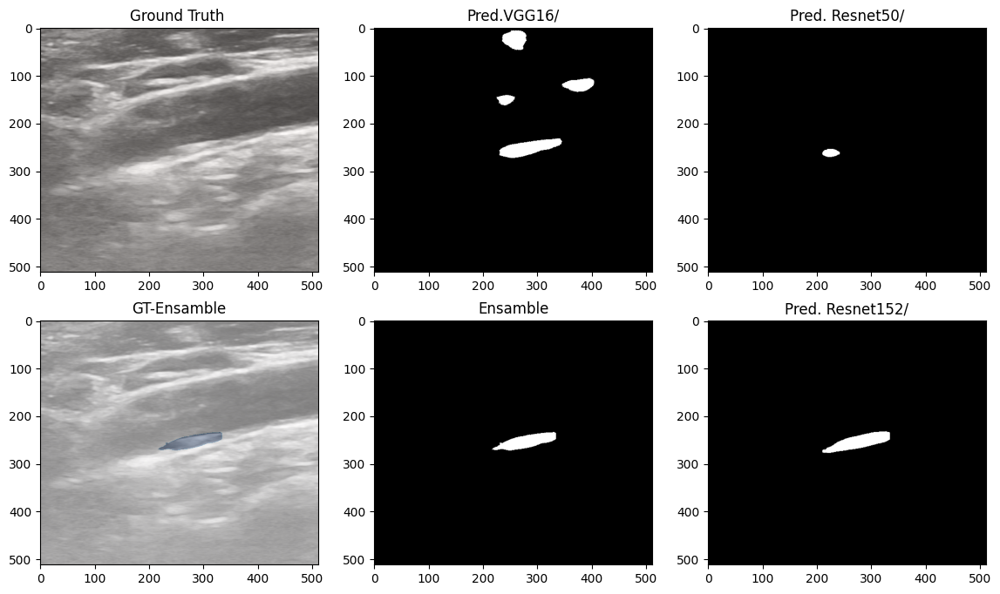

In [39]:
item = random.randint(0, len(images_test)-1)
item = 15
monocroma=X_test[item]
etiqueta=Y_test[item]
red1=preds[item,:,:,0]
red2=preds[item,:,:,1]
red3=preds[item,:,:,2]
print('imagen'+test_ids[item])
print('imagen item = '+ str(item))

model_comparac_3(monocroma, etiqueta, red1 ,red2, red3, ensamble[item])
print('Jaccard:', jacard_coef_np(Y_test[item], ensamble[item]))
print('DICE:',dice_coef_np(Y_test[item], ensamble[item]))

fname=path_modelo+'resultado_imagen_Test_'+test_ids[item]
plt.savefig(fname)


<ipython-input-16-655d349c9ea7>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2,3,figsize=(14,8)) #cambié para que se vean horizontales


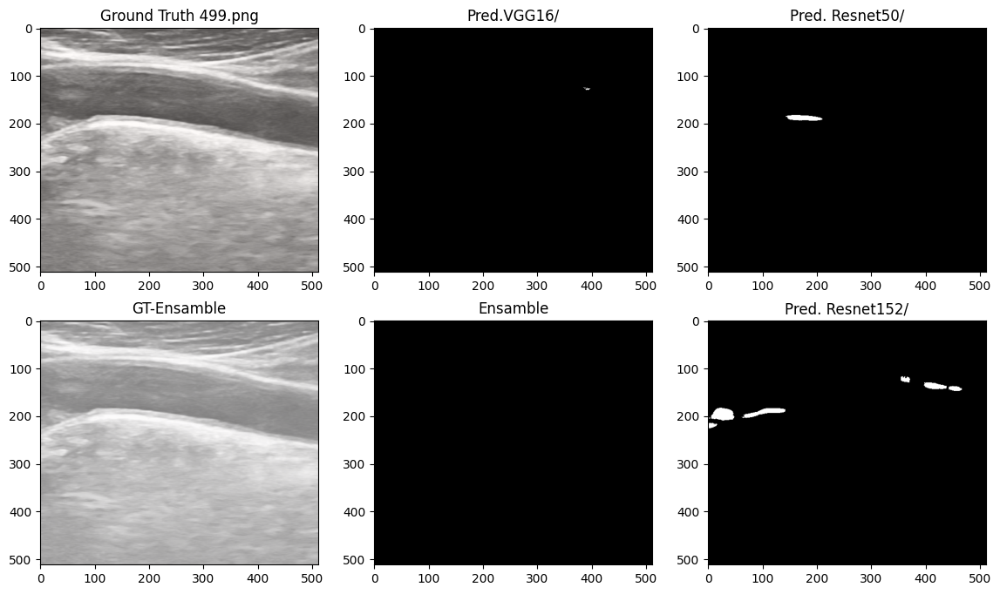

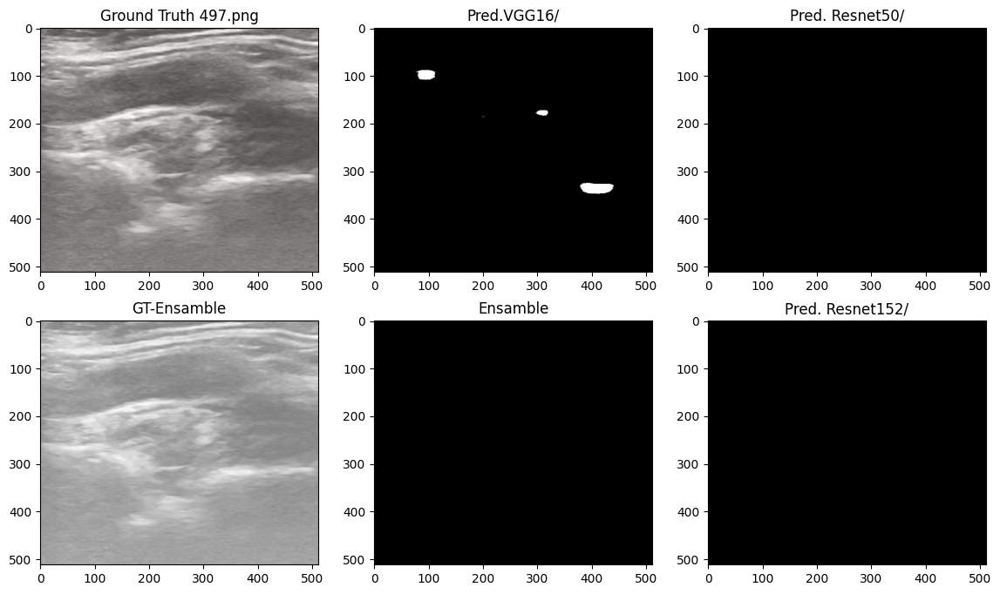

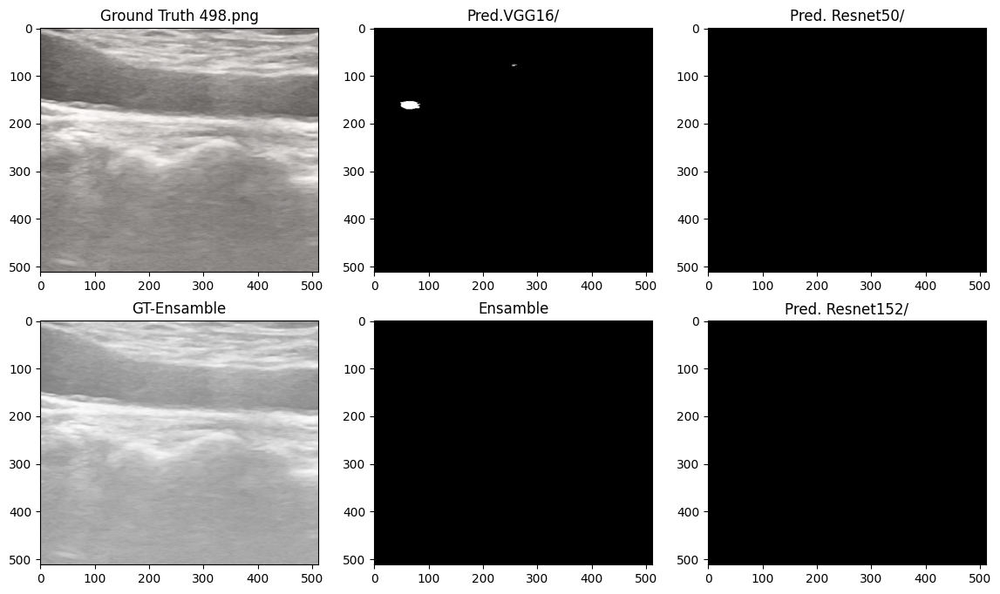

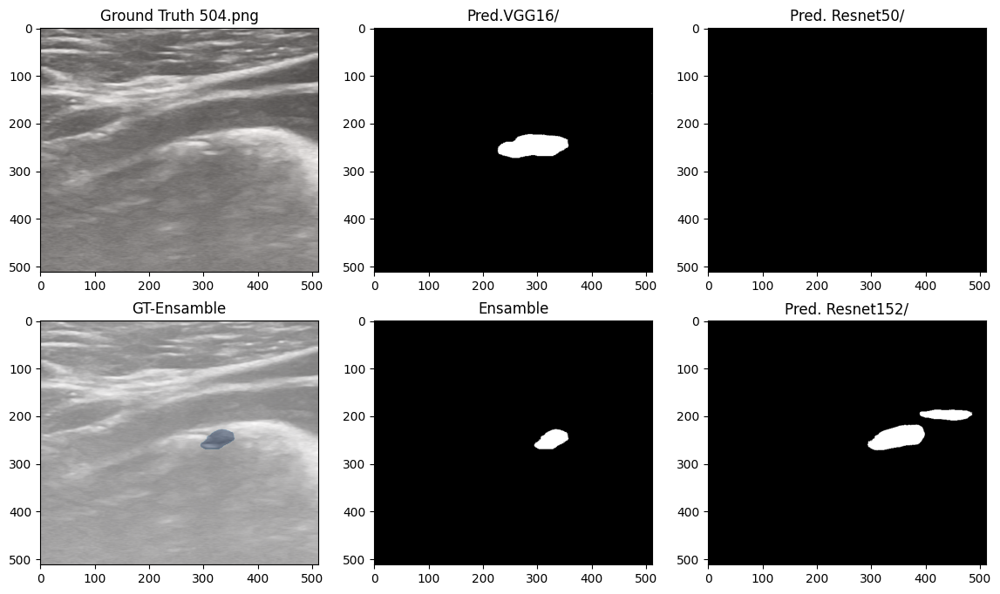

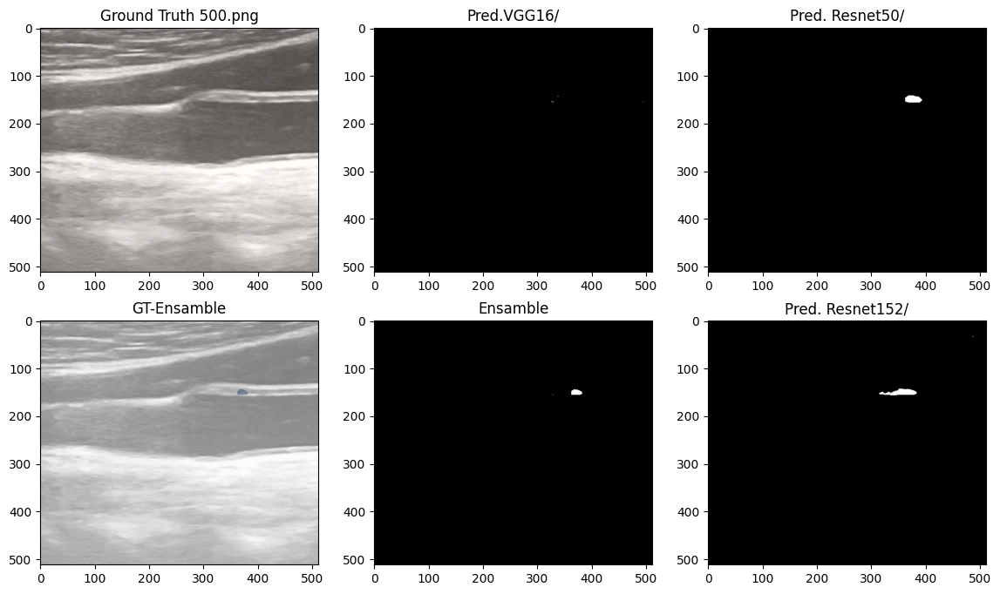

...

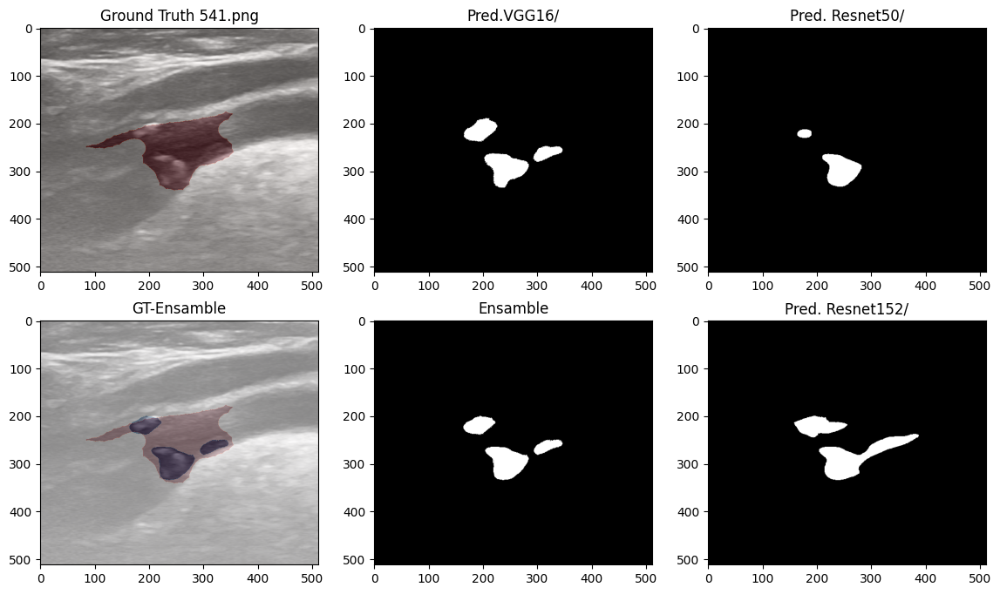

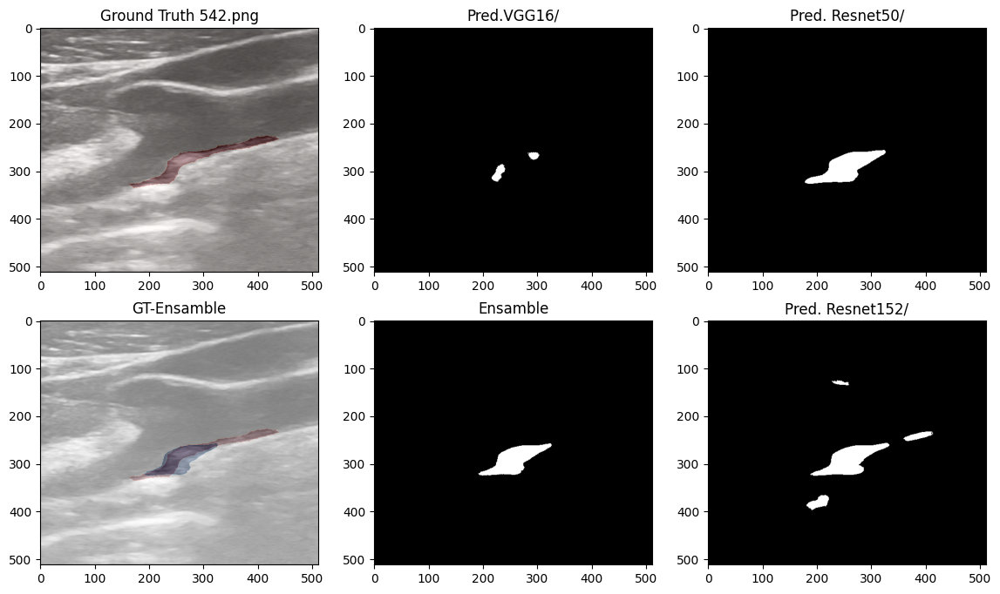

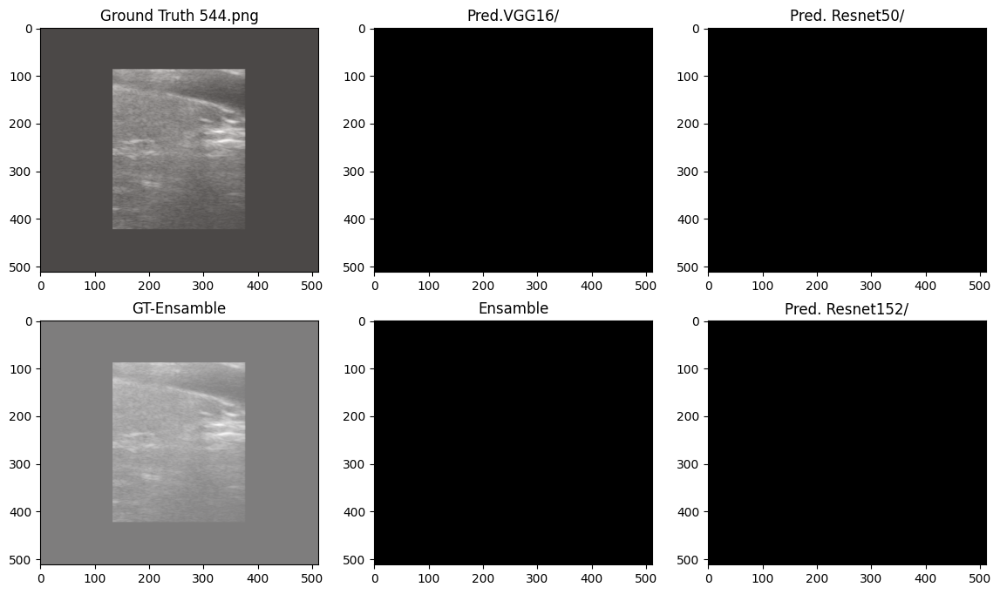

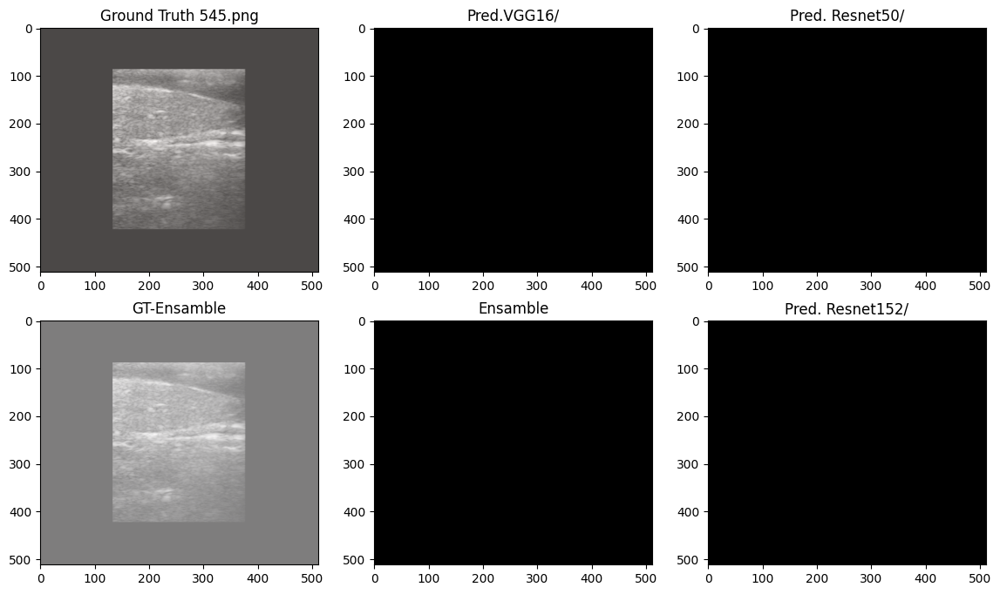

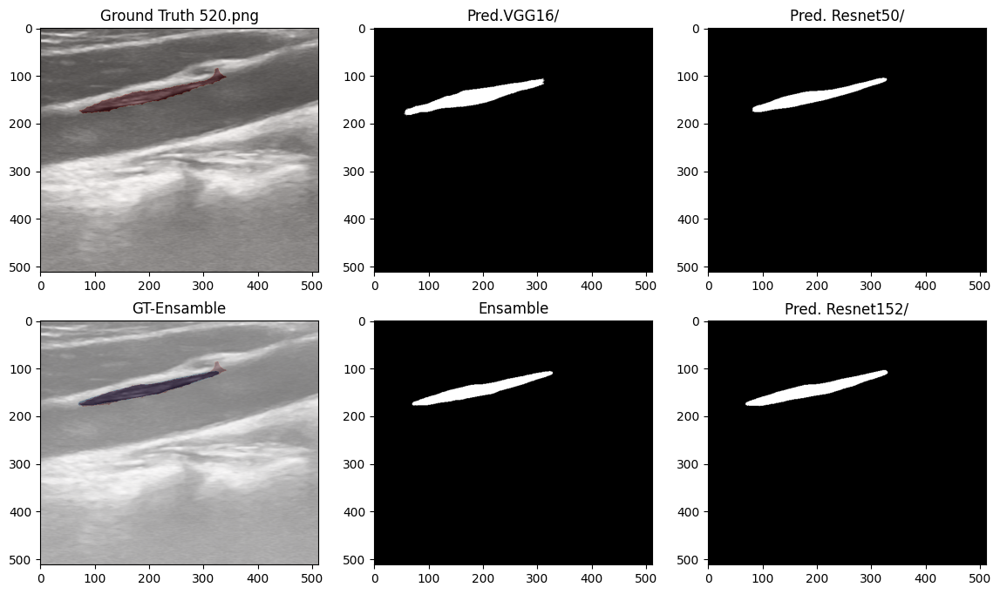

In [40]:
for item in range(len(images_test)):
  monocroma=X_test[item]
  etiqueta=Y_test[item]
  red1=preds[item,:,:,0]
  red2=preds[item,:,:,1]
  red3=preds[item,:,:,2]
  model_comparac_3(monocroma, etiqueta, red1 ,red2, red3,ensamble[item],titulo=test_ids[item])
  fname=path_modelo+'resultado_imagen_Test_'+test_ids[item]
  plt.savefig(fname)

In [41]:
print('Global')
print('Jaccard:',jacard_coef_np(Y_test, ensamble))
print('DICE:',dice_coef_np(Y_test, ensamble))

Global
Jaccard: 0.4665647726700146
DICE: 0.6362680605055567


In [42]:
n=len(images_test)
D=0.0
J=0.0
for item in range(n):
  J=J+jacard_coef_np(Y_test[item], ensamble[item])
  D=D+dice_coef_np(Y_test[item], ensamble[item])

J=J/20
D=D/20

print('Promedio')
print('Jaccard:',J)
print('DICE:',D)


Promedio
Jaccard: 1.1846616138773227
DICE: 1.3424623965476266


In [43]:
print(len(preds.shape))
print(ensamble.shape)

4
(48, 512, 512)


### Cálculo de coeficientes test

In [44]:
Coeficientes_test=np.zeros((len(images_test),8))

Coeficientes_test[:,0:3]=calc_coefs_Jaccard(Y_test, preds) #Jac_modelos
Coeficientes_test[:,3]=calc_coefs_Jaccard(Y_test, ensamble) #Jac_ensamble


Coeficientes_test[:,4:7]=calc_coefs_DICE(Y_test, preds)#DSC_modelos
Coeficientes_test[:,7]=calc_coefs_DICE(Y_test, ensamble) #DSC_ensamble

Coeficientes_test=np.round(Coeficientes_test,4)

### Conteo de falsos positivos,
sumamos el área de placa predicha (en pixeles) en donde no había placa en el GT

In [45]:
preds_p_sin_placa=preds[placa_test==0].astype('int64')
ensamble_p_sin_placa=ensamble[placa_test==0].astype('int64')

suma_test=np.zeros((len(preds[placa_test==0]),4))

suma_test[:,0:3]=np.sum(preds_p_sin_placa,axis=(1,2)) #suma de falsos positivosp_modelos
suma_test[:,3]=np.sum(ensamble_p_sin_placa, axis=(1,2)) #suma_ensamble

## Data frame

In [46]:
import pandas as pd

In [47]:
# Creación de DataFrame:
df_test= pd.DataFrame(Coeficientes_test,index=test_ids, columns=['Jac_modA','Jac_modB','Jac_modC','Jac_ensamble','DSC_modA','DSC_modB','DSC_modC','DSC_ensamble'])
df_test['placa']=placa_test
df_cp_test=df_test[placa_test==1]
# Creación de DataFrame:
df_sp_test= pd.DataFrame(suma_test,index=test_sp_ids, columns=['pred_modA','pred_modB','pred_modC','pred_ensamble'])


In [48]:
#otra opción
#df_cp_test= pd.DataFrame(Coeficientes_test[placa_test==1],index=test_cp_ids, columns=['Jac_modA','Jac_modB','Jac_modC','Jac_ensamble','DSC_modA','DSC_modB','DSC_modC','DSC_ensamble'])

In [49]:
# Guarda datos en CSV:
df_cp_test.to_csv(path_modelo+'coefic_test_cp.csv')#, header=False, index=False)
df_sp_test.to_csv(path_modelo+'coefic_test_sp.csv')
# Guardar el DataFrame como un archivo Excel
df_cp_test.to_excel(path_modelo + 'coefic_test_cp.xlsx', index=False)
df_sp_test.to_excel(path_modelo + 'coefic_test_sp.xlsx', index=False)

In [95]:
df_cp_test

,Jac_modA,Jac_modB,Jac_modC,Jac_ensamble,DSC_modA,DSC_modB,DSC_modC,DSC_ensamble,placa
521.png,0.3805,0.0002,0.7147,0.3754,0.5512,0.0002,0.8336,0.5458,1
523.png,0.1707,0.2157,0.4669,0.2296,0.2916,0.3548,0.6366,0.3733,1
522.png,0.3297,0.4868,0.6144,0.5628,0.4959,0.6548,0.7612,0.7203,1
524.png,0.1265,0.6712,0.1700,0.2401,0.2244,0.8032,0.2904,0.3871,1
528.png,0.3923,0.4266,0.1688,0.3236,0.5635,0.5981,0.2888,0.4890,1
527.png,0.7289,0.7380,0.5480,0.7532,0.8432,0.8492,0.7080,0.8592,1
526.png,0.8145,0.9004,0.6179,0.8109,0.8978,0.9476,0.7638,0.8955,1
529.png,0.6060,0.7043,0.6124,0.6965,0.7547,0.8265,0.7596,0.8211,1
525.png,0.6274,0.8033,0.8139,0.8149,0.7711,0.8909,0.8974,0.8980,1
531.png,0.5427,0.6867,0.6127,0.6986,0.7035,0.8142,0.7599,0.8225,1


In [51]:
df_sp_test.head()
df_sp_test

,pred_modA,pred_modB,pred_modC,pred_ensamble
499.png,27.0,593.0,2476.0,0.0
497.png,1876.0,0.0,0.0,0.0
498.png,498.0,0.0,0.0,0.0
504.png,4793.0,0.0,5520.0,1746.0
500.png,8.0,382.0,584.0,193.0
501.png,1788.0,1665.0,567.0,989.0
505.png,3626.0,0.0,2845.0,2121.0
503.png,112.0,1452.0,132.0,0.0
502.png,32.0,0.0,1.0,0.0
509.png,2095.0,34.0,3724.0,542.0


ver: [Matplotlib](https://matplotlib.org/)

**Tabla Símbolo- Color**

“b”	Azul;
“g”	Verde;
“r”	Rojo, etc.; 'c' as cyan;
'm' as magenta;
'y' as yellow;
'k' as black;
'w' as white

https://matplotlib.org/stable/tutorials/colors/colors.html

**Símbolo-	Descripción**

“-“	Línea continua;
“–”	Línea a trazos

“-.”	Línea a puntos y rayas;
“o”	Símbolo círculo relleno

“v”	Símbolo triángulo hacia abajo;
“*”	Símbolo estrella, etc.

ver: [Pyplot de Matplotlib - plt](https://matplotlib.org/stable/tutorials/introductory/pyplot.html)

##graficos comparación Jaccard

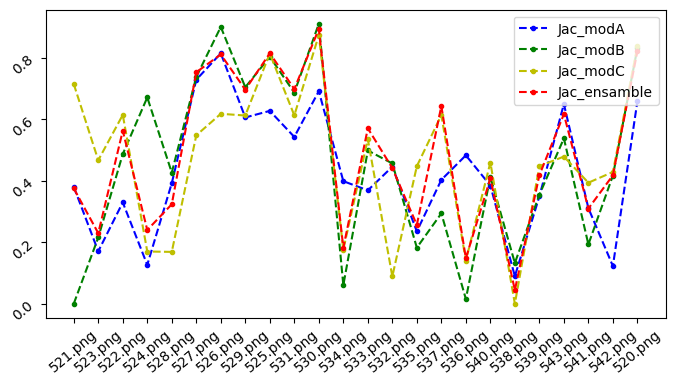

In [52]:
plt.figure(figsize=(8,4))
plt.plot(df_cp_test.Jac_modA,'b--.') #'rd',x, x3,'g^',
plt.plot(df_cp_test.Jac_modB,'g--.')# en color verde con guiones y punto
plt.plot(df_cp_test.Jac_modC,'y--.') #'rd',x, x3,'g^',
plt.plot(df_cp_test.Jac_ensamble,'r--.')# en color verde con guiones y punto diamante
plt.gca().legend(('Jac_modA','Jac_modB','Jac_modC','Jac_ensamble'),loc='upper right')
plt.tick_params(labelrotation=40)
#plt.show()
fname=path_modelo+'Jaccard_Test_A_B_C_Ensamble'
#plt.savefig(fname)
plt.show()

<Figure size 800x1000 with 0 Axes>

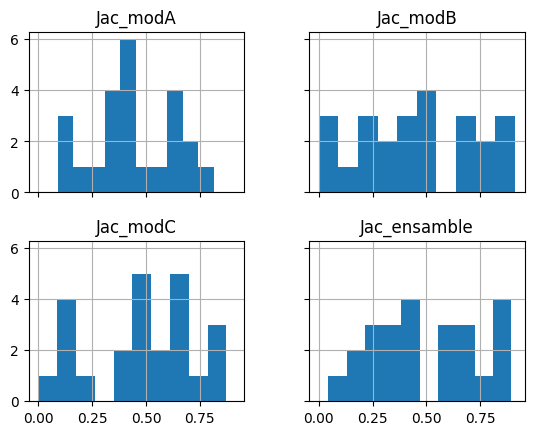

In [53]:
plt.figure(figsize=(8,10))
col=['Jac_modA','Jac_modB','Jac_modC','Jac_ensamble']
##col=['DSC_modA','DSC_modB','DSC_modC','DSC_ensamble']
df_cp_test.hist(column=col, by=None, grid=True, xlabelsize=None, xrot=None, ylabelsize=None, yrot=None, ax=None, sharex=True, sharey=True, figsize=None, layout=None, bins=10, backend=None, legend=False)#[source]

fname=path_modelo+'Histogr_Jac_Test'
plt.savefig(fname)
plt.show()

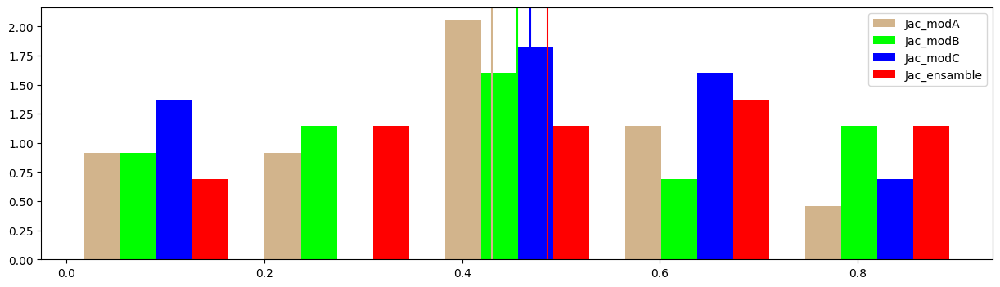

In [54]:
n_bins = 5
med=df_cp_test.mean()
cols=['Jac_modA','Jac_modB','Jac_modC','Jac_ensamble']

plt.figure(figsize=(15,4))
colors = ['tan', 'lime','blue','red']

plt.hist(df_cp_test[cols], n_bins, density=True, histtype='bar', color=colors, label=colors)
plt.gca().legend(('Jac_modA','Jac_modB','Jac_modC','Jac_ensamble'))#,loc='upper right')

for i in range(4):
  plt.axvline(x=med[cols[i]], color=colors[i])

fname=path_modelo+'Histogr_con_media_Jacc_A_B_C_Ensamble'
plt.savefig(fname)
plt.show()

##graficos comparación DICE

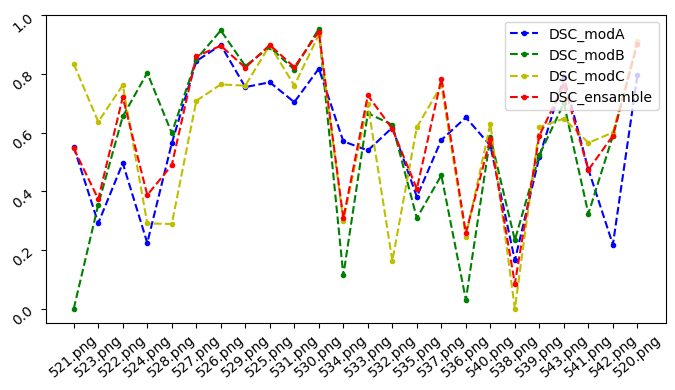

In [55]:
plt.figure(figsize=(8,4))
plt.plot(df_cp_test.DSC_modA,'b--.') #'rd',x, x3,'g^',
plt.plot(df_cp_test.DSC_modB,'g--.')# en color verde con guiones y punto
plt.plot(df_cp_test.DSC_modC,'y--.') #'rd',x, x3,'g^',
#plt.plot(df.DSC_mod4,'c--.')# en color verde con guiones y punto diamante
plt.plot(df_cp_test.DSC_ensamble,'r--.')# en color verde con guiones y punto diamante
plt.gca().legend(('DSC_modA','DSC_modB','DSC_modC','DSC_ensamble'),loc='upper right')
plt.tick_params(labelrotation=40)

fname=path_modelo+'DICE_Test_A_B_C_Ensamble'
plt.savefig(fname)
plt.show()

<Figure size 800x1000 with 0 Axes>

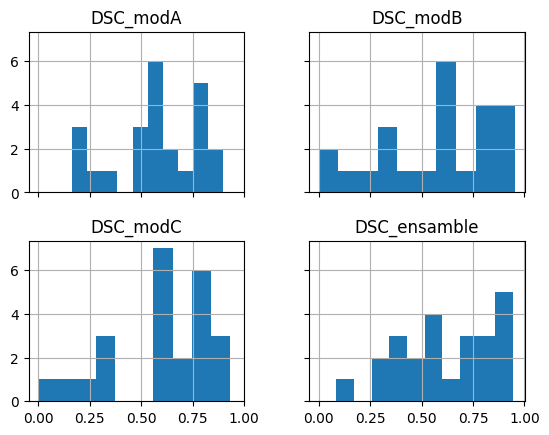

In [56]:
plt.figure(figsize=(8,10))
#col=['Jac_modA','Jac_modB','Jac_modC','Jac_ensamble']
col=['DSC_modA','DSC_modB','DSC_modC','DSC_ensamble']
df_cp_test.hist(column=col, by=None, grid=True, xlabelsize=None, xrot=None, ylabelsize=None, yrot=None, ax=None, sharex=True, sharey=True, figsize=None, layout=None, bins=10, backend=None, legend=False)#[source]

fname=path_modelo+'Histogr_DSC_Test'
plt.savefig(fname)
plt.show()

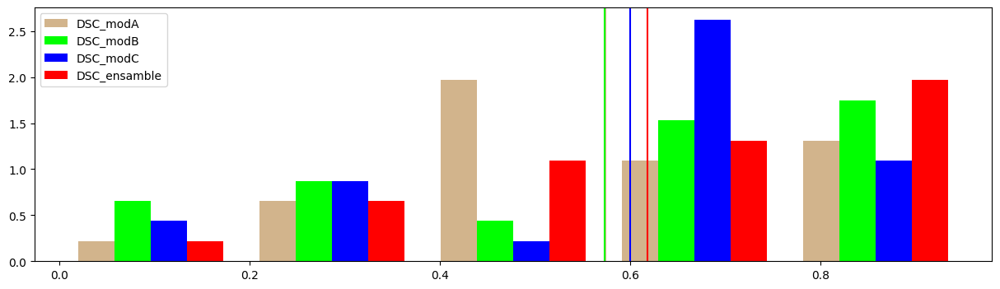

In [57]:
n_bins = 5
med=df_cp_test.mean()
cols=['DSC_modA','DSC_modB','DSC_modC','DSC_ensamble']

plt.figure(figsize=(15,4))
colors = ['tan', 'lime','blue','red']
plt.hist(df_cp_test[cols], n_bins, density=True, histtype='bar', color=colors, label=colors)
plt.gca().legend(('DSC_modA','DSC_modB','DSC_modC','DSC_ensamble'))#,loc='upper right')


for i in range(4):
  plt.axvline(x=med[cols[i]], color=colors[i])

fname=path_modelo+'Histogr_con_media_DSC_A_B_C_Ensamble'
plt.savefig(fname)
plt.show()

In [58]:
df_cp_test[['DSC_modA','DSC_modB','DSC_modC','DSC_ensamble']]

,DSC_modA,DSC_modB,DSC_modC,DSC_ensamble
521.png,0.5512,0.0002,0.8336,0.5458
523.png,0.2916,0.3548,0.6366,0.3733
522.png,0.4959,0.6548,0.7612,0.7203
524.png,0.2244,0.8032,0.2904,0.3871
528.png,0.5635,0.5981,0.2888,0.4890
527.png,0.8432,0.8492,0.7080,0.8592
526.png,0.8978,0.9476,0.7638,0.8955
529.png,0.7547,0.8265,0.7596,0.8211
525.png,0.7711,0.8909,0.8974,0.8980
531.png,0.7035,0.8142,0.7599,0.8225


## gráf. Comparación falsos positivos (FP)

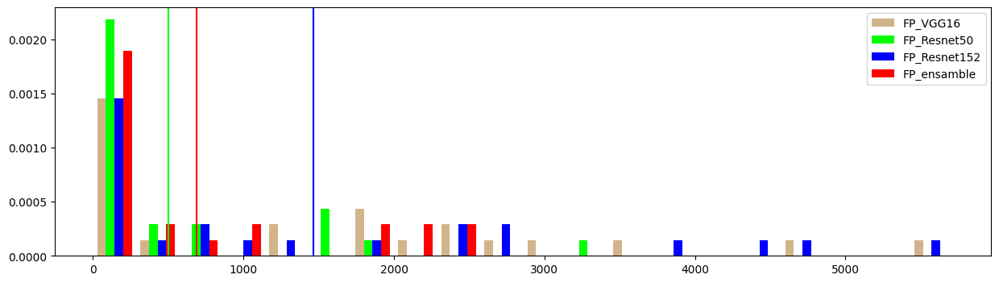

In [99]:
n_bins = 20
med=df_sp_test.mean()
cols=['pred_modA',	'pred_modB','pred_modC',	'pred_ensamble']

plt.figure(figsize=(15,4))
colors = ['tan', 'lime','blue','red']
plt.hist(df_sp_test, n_bins, density=True, histtype='bar', color=colors, label=colors)
plt.gca().legend(('FP_VGG16','FP_Resnet50','FP_Resnet152','FP_ensamble'))#,loc='upper right')


for i in range(4):
  plt.axvline(x=med[cols[i]], color=colors[i])

fname=path_modelo+'Histograma_FP_con_media_Test_A_B_C_Ensamble'
plt.savefig(fname)
plt.show()

la media de VGG16 concide con la de Resnet 152, por eso no se ve

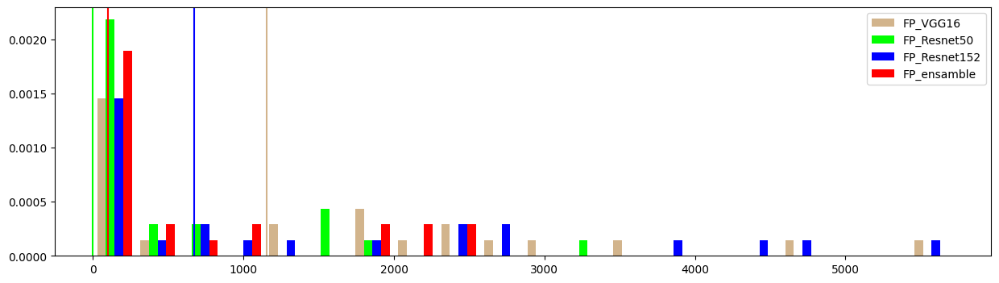

In [100]:
n_bins = 20
med=df_sp_test.median()
cols=['pred_modA',	'pred_modB','pred_modC',	'pred_ensamble']

plt.figure(figsize=(15,4))
colors = ['tan', 'lime','blue','red']
plt.hist(df_sp_test, n_bins, density=True, histtype='bar', color=colors, label=colors)
plt.gca().legend(('FP_VGG16','FP_Resnet50','FP_Resnet152','FP_ensamble'))#,loc='upper right')


for i in range(4):
  plt.axvline(x=med[cols[i]], color=colors[i])

fname=path_modelo+'Histograma_FP_con_mediana_Test_A_B_C_Ensamble'
plt.savefig(fname)
plt.show()

## Resultados TEST

In [61]:
print ('50% es la mediana')
df_cp_test.describe().loc[['50%','mean','std']]

50% es la mediana


,Jac_modA,Jac_modB,Jac_modC,Jac_ensamble,DSC_modA,DSC_modB,DSC_modC,DSC_ensamble,placa
50%,0.395550,0.441500,0.472850,0.429750,0.566800,0.612400,0.642050,0.601000,1.0
mean,0.429642,0.455463,0.469229,0.486546,0.573338,0.573100,0.599562,0.618042,1.0
std,0.202286,0.281375,0.241453,0.244554,0.206554,0.289591,0.252526,0.234656,0.0


In [62]:
df_cp_test.mean()#

Jac_modA        0.429642
Jac_modB        0.455463
Jac_modC        0.469229
Jac_ensamble    0.486546
DSC_modA        0.573337
DSC_modB        0.573100
DSC_modC        0.599563
DSC_ensamble    0.618042
placa           1.000000
dtype: float64

In [63]:
df_cp_test.std()#

Jac_modA        0.202286
Jac_modB        0.281375
Jac_modC        0.241453
Jac_ensamble    0.244554
DSC_modA        0.206554
DSC_modB        0.289591
DSC_modC        0.252526
DSC_ensamble    0.234656
placa           0.000000
dtype: float64

In [64]:
df_sp_test.describe()#.loc[['mean','std']]

,pred_modA,pred_modB,pred_modC,pred_ensamble
count,24.000000,24.000000,24.000000,24.00000
mean,1464.958333,500.666667,1465.791667,686.25000
std,1622.928606,842.839232,1727.120121,914.58003
min,0.000000,0.000000,0.000000,0.00000
25%,30.750000,0.000000,0.750000,0.00000
50%,1153.500000,0.000000,673.000000,96.50000
75%,2295.000000,652.500000,2540.750000,1178.25000
max,5715.000000,3144.000000,5520.000000,2495.00000


In [65]:
print ('50% es la mediana')
df_sp_test.describe().loc[['50%','mean','std']].round()

50% es la mediana


,pred_modA,pred_modB,pred_modC,pred_ensamble
50%,1154.0,0.0,673.0,96.0
mean,1465.0,501.0,1466.0,686.0
std,1623.0,843.0,1727.0,915.0


In [66]:
df_sp_test.median()#

pred_modA        1153.5
pred_modB           0.0
pred_modC         673.0
pred_ensamble      96.5
dtype: float64

In [67]:
df_sp_test.mean().round(1)#.loc[['mean','std']]

pred_modA        1465.0
pred_modB         500.7
pred_modC        1465.8
pred_ensamble     686.2
dtype: float64

In [68]:
#df_cp_test[['Jac_ensamble','Jac_modA']]

## Train

## Predichos para train

In [69]:

#database_path = os.path.join(path_train, "clean_png_train")#se usaba para base mejorada
database_path = path_train

files_train = os.listdir(database_path)

images_train = [item for item in files_train if 'labeled' not in item]


#random.shuffle(images)

print(f'Total number of Train images: {len(images_train)}')
print(images_train)


train_ids = images_train

Total number of Train images: 493
['201.png', '203.png', '78.png', '45.png', '237.png', '83.png', '96.png', '259.png', '204.png', '47.png', '25.png', '200.png', '91.png', '106.png', '102.png', '202.png', '56.png', '110.png', '146.png', '80.png', '207.png', '206.png', '217.png', '239.png', '231.png', '233.png', '169.png', '175.png', '135.png', '111.png', '223.png', '113.png', '126.png', '229.png', '253.png', '193.png', '15.png', '137.png', '196.png', '2.png', '180.png', '151.png', '213.png', '166.png', '248.png', '228.png', '188.png', '150.png', '211.png', '174.png', '127.png', '161.png', '230.png', '235.png', '214.png', '147.png', '104.png', '152.png', '192.png', '19.png', '244.png', '23.png', '212.png', '183.png', '105.png', '142.png', '222.png', '140.png', '186.png', '13.png', '159.png', '219.png', '14.png', '249.png', '116.png', '252.png', '181.png', '125.png', '250.png', '154.png', '107.png', '148.png', '177.png', '120.png', '179.png', '185.png', '20.png', '241.png', '225.png', '18

In [70]:
train_images = []
train_masks = []

for image_id in train_ids:

    image_path = os.path.join(database_path, str(image_id))
    train_images.append(image_path)
    mask_path = os.path.join(database_path, image_id.replace(".png","")) + "_labeled.png"
    train_masks.append(mask_path)

In [71]:
Xtrain = []
Ytrain = []
placa_train = []
train_sp_ids= []
train_cp_ids= []

for image_id in train_ids:

    #print(image_id)

    image_path = os.path.join(database_path, str(image_id))
    mask_path = os.path.join(database_path, image_id.replace(".png","")) + "_labeled.png"
    image = cv2.imread(image_path, 0)
    mask = cv2.imread(mask_path, 0)
    Xtrain.append(image)
    Ytrain.append(mask)
    if np.sum(mask) == 0:
      placa_train.append(0)
      train_sp_ids.append(image_id)

    else:
      placa_train.append(1)
      train_cp_ids.append(image_id)


placa_train = np.asarray(placa_train, dtype=np.uint8)
print('placa:',placa_train.shape)

placa: (493,)


In [72]:
#armar nueva lista
centro_x= 400
centro_y=400

for r in range(len(train_ids)):
  h,w=Xtrain[r].shape
  imagenvieja=Xtrain[r]

  if h<800 or w<800:
    imagen_auxiliar=np.zeros((800,800),dtype='uint8')
    top_y=(800-h)//2
    left_x=(800-w)//2
    bottom_y = top_y + h
    right_x = left_x+w
    imagen_auxiliar[top_y:bottom_y, left_x:right_x] = imagenvieja
    imagenvieja=imagen_auxiliar


  Xtrain[r]= imagenvieja[144:656, 144:656]# 512x512 centrado


In [73]:
X_train = np.asarray(Xtrain, dtype=np.uint8)
print('Xtrain:',X_train.shape)



Xtrain: (493, 512, 512)


In [74]:
#armar nueva lista
centro_x= 400
centro_y=400

for r in range(len(train_ids)):
  h,w=Ytrain[r].shape
  imagenvieja=Ytrain[r]

  if h<800 or w<800:
    imagen_auxiliar=np.zeros((800,800),dtype='uint8')
    top_y=(800-h)//2
    left_x=(800-w)//2
    bottom_y = top_y + h
    right_x = left_x+w
    imagen_auxiliar[top_y:bottom_y, left_x:right_x] = imagenvieja
    imagenvieja=imagen_auxiliar


  Ytrain[r]= imagenvieja[144:656, 144:656]# 512x512 centrado

In [75]:
Y_train = np.asarray(Ytrain, dtype=bool)
print('Ytrain:',Y_train.shape)


Ytrain: (493, 512, 512)


In [76]:
pred_train=np.zeros((len(Y_train),512,512,3))

In [77]:
pred_train1= TLmodel1.predict(X_train)

16/16 [==============================] - 594s 37s/step


In [78]:
pred_train[:,:,:,0]=pred_train1[:,:,:,0] #quito la última dim "ficticia"

In [79]:
pred_train2= TLmodel2.predict(X_train)

16/16 [==============================] - 349s 22s/step


In [80]:
pred_train[:,:,:,1]=pred_train2[:,:,:,0] #quito la última dim "ficticia"

In [81]:
pred_train3= TLmodel3.predict(X_train)

16/16 [==============================] - 555s 35s/step


In [82]:
pred_train[:,:,:,2]=pred_train3[:,:,:,0] #quito la última dim "ficticia"

In [83]:
result_train = pred_train.copy()
resul_train=pred_train >0.5

pred_train=resul_train
ensamble_t_soft=np.sum(resul_train,3)
ensamble_t=ensamble_t_soft >=2
print(pred_train.shape, ensamble_t.shape)

(493, 512, 512, 3) (493, 512, 512)


imagen96.png
imagen item = 6
Jaccard ensamble: 0.8124869055101613
DICE ensamble: 0.8965377723830993


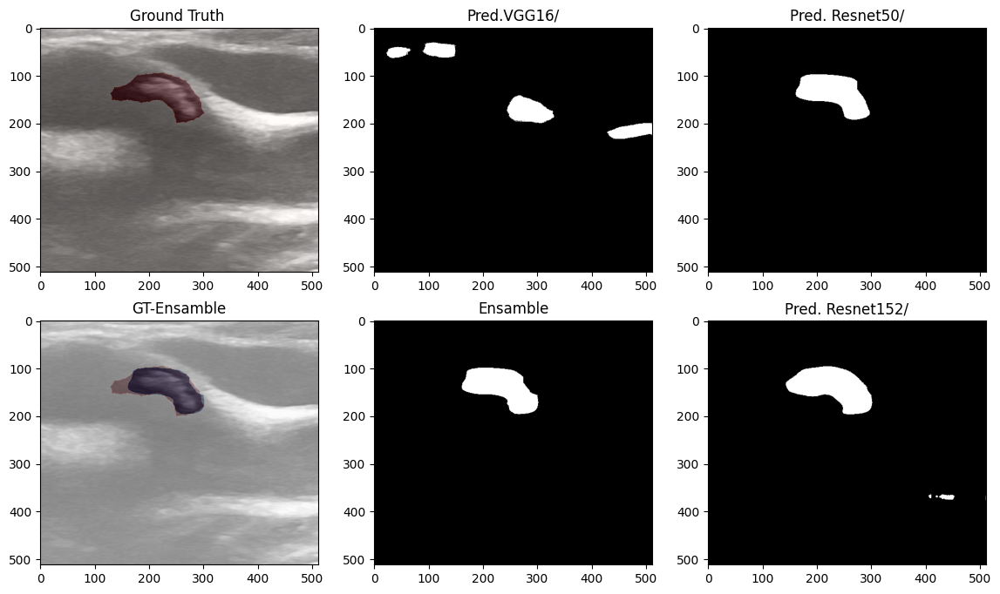

In [84]:
item = random.randint(0, len(X_train)-1)
item = 6
monocroma=X_train[item]
etiqueta=Y_train[item]
red1=pred_train[item,:,:,0]
red2=pred_train[item,:,:,1]
red3=pred_train[item,:,:,2]
#red4=pred_train[item,:,:,3]
print('imagen'+train_ids[item])
print('imagen item = '+ str(item))

model_comparac_3(monocroma, etiqueta, red1 ,red2, red3, ensamble_t[item])
print('Jaccard ensamble:', jacard_coef_np(Y_train[item], ensamble_t[item]))
print('DICE ensamble:',dice_coef_np(Y_train[item], ensamble_t[item]))

fname=path_modelo+'resultado_imagen_Train_'+train_ids[item]
plt.savefig(fname)


### Cálculo de coeficientes train

In [85]:
Coeficientes_train=np.zeros((len(train_ids),8))

Coeficientes_train[:,0:3]=calc_coefs_Jaccard(Y_train, pred_train) #Jac_modelos
Coeficientes_train[:,3]=calc_coefs_Jaccard(Y_train, ensamble_t) #Jac_ensamble


Coeficientes_train[:,4:7]=calc_coefs_DICE(Y_train, pred_train)#DSC_modelos
Coeficientes_train[:,7]=calc_coefs_DICE(Y_train, ensamble_t) #DSC_ensamble


Coeficientes_train=np.round(Coeficientes_train,4)

### Conteo de falsos positivos,
sumamos el área de placa predicha (en pixeles) en donde no había placa en el GT

In [86]:
preds_p_sin_placa_train=pred_train[placa_train==0].astype('int64')
ensamble_p_sin_placa_train=ensamble_t[placa_train==0].astype('int64')

suma_train=np.zeros((len(preds_p_sin_placa_train),4))

suma_train[:,0:3]=np.sum(preds_p_sin_placa_train,axis=(1,2)) #suma de falsos positivosp_modelos
suma_train[:,3]=np.sum(ensamble_p_sin_placa_train, axis=(1,2)) #suma_ensamble

## Data frame

In [87]:
import pandas as pd

# Creación de DataFrame:
df_train= pd.DataFrame(Coeficientes_train,index=train_ids, columns=['Jac_modA','Jac_modB','Jac_modC','Jac_ensamble','DSC_modA','DSC_modB','DSC_modC','DSC_ensamble'])
df_train['placa']=placa_train
df_cp_train=df_train[placa_train==1]
# Creación de DataFrame:
df_sp_train= pd.DataFrame(suma_train,index=train_sp_ids, columns=['pred_modA','pred_modB','pred_modC','pred_ensamble'])


In [88]:
#otra opción
#df_cp_train= pd.DataFrame(Coeficientes_train[placa_train==1],index=test_sp_ids, columns=['Jac_mod1','Jac_mod2','Jac_mod3','Jac_ensamble','DSC_mod1','DSC_mod2','DSC_mod3','DSC_ensamble'])

In [89]:
# Guarda datos en CSV:
df_cp_train.to_csv(path_modelo+'coefic_train_cp.csv')#, header=False, index=False)
df_sp_train.to_csv(path_modelo+'coefic_train_sp.csv')
# Guardar el DataFrame como un archivo Excel
df_cp_train.to_excel(path_modelo + 'coefic_train_cp.xlsx', index=False)
df_sp_train.to_excel(path_modelo + 'coefic_train_sp.xlsx', index=False)

In [90]:
df_cp_train.head()

,Jac_modA,Jac_modB,Jac_modC,Jac_ensamble,DSC_modA,DSC_modB,DSC_modC,DSC_ensamble,placa
78.png,0.7429,0.8971,0.9164,0.9040,0.8525,0.9458,0.9564,0.9496,1
45.png,0.6445,0.9244,0.9395,0.9277,0.7838,0.9607,0.9688,0.9625,1
237.png,0.5698,0.6705,0.7859,0.7255,0.7260,0.8028,0.8801,0.8409,1
83.png,0.5093,0.8108,0.7153,0.8002,0.6747,0.8955,0.8340,0.8890,1
96.png,0.1520,0.7943,0.8608,0.8125,0.2639,0.8854,0.9252,0.8965,1


In [91]:
df_sp_train.head()

,pred_modA,pred_modB,pred_modC,pred_ensamble
201.png,1248.0,0.0,0.0,0.0
203.png,565.0,0.0,31.0,0.0
204.png,864.0,1122.0,550.0,495.0
200.png,434.0,0.0,9.0,0.0
202.png,692.0,0.0,0.0,0.0


## Histogramas comparación

imagen148.png
imagen item = 81
Medidas:  Ensamble
Jaccard: 0.5861
DICE: 0.7391


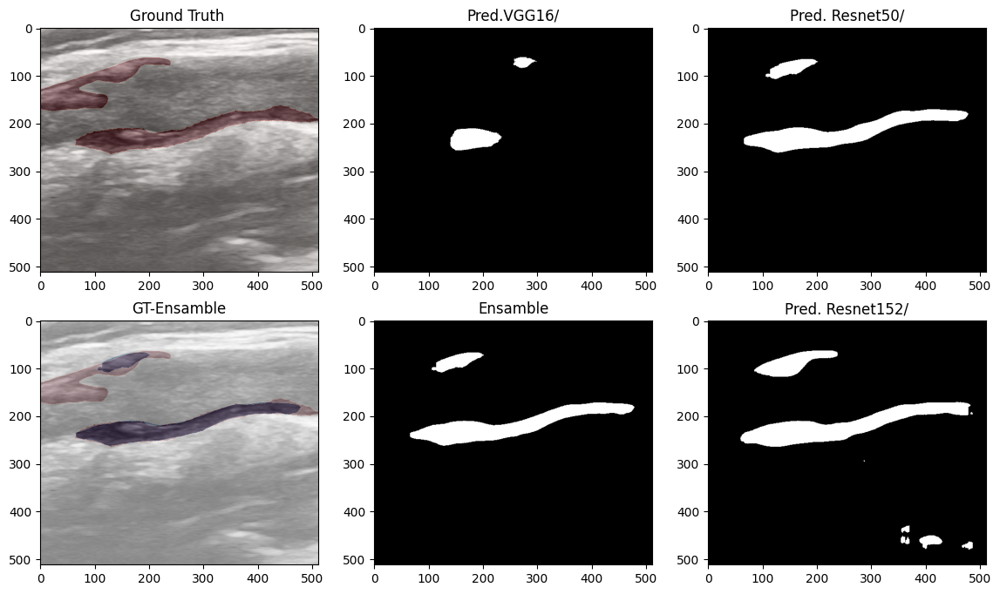

In [92]:
item = random.randint(0, len(train_ids)-1)
#item = 6
monocroma=X_train[item]
etiqueta=Y_train[item]

print('imagen'+train_ids[item])
print('imagen item = '+ str(item))
red1=pred_train[item,:,:,0]
red2=pred_train[item,:,:,1]
red3=pred_train[item,:,:,2]

model_comparac_3(monocroma, etiqueta, red1 ,red2, red3, ensamble_t[item])
print('Medidas:  Ensamble')
print('Jaccard:', np.round(jacard_coef_np(Y_train[item], ensamble_t[item]),4))
print('DICE:',np.round(dice_coef_np(Y_train[item], ensamble_t[item]),4))

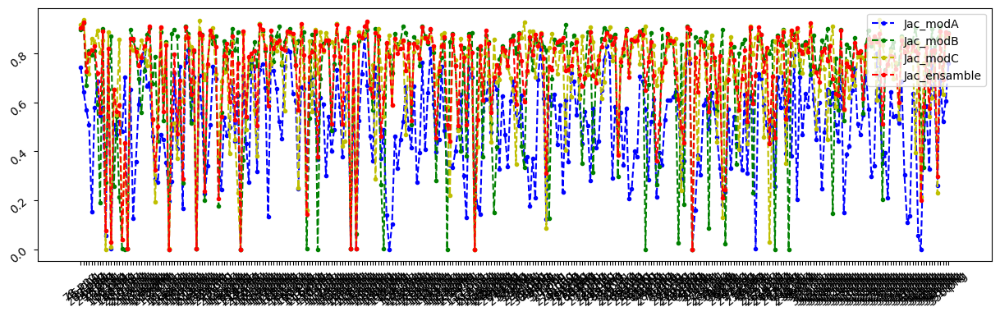

In [93]:
plt.figure(figsize=(15,4))

plt.plot(df_cp_train.Jac_modA,'b--.') #'rd',x, x3,'g^',
plt.plot(df_cp_train.Jac_modB,'g--.')# en color verde con guiones y punto
plt.plot(df_cp_train.Jac_modC,'y--.') #'rd',x, x3,'g^',
#plt.plot(df_train.Jac_mod4,'c--.')# en color verde con guiones y punto diamante
plt.plot(df_cp_train.Jac_ensamble,'r--.')# en color verde con guiones y punto diamante
plt.gca().legend(('Jac_modA','Jac_modB','Jac_modC','Jac_ensamble'),loc='upper right')
plt.tick_params(labelrotation=40)
#plt.show()
fname=path_modelo+'Jaccard_Train_A_B_C_Ensamble'
plt.savefig(fname)

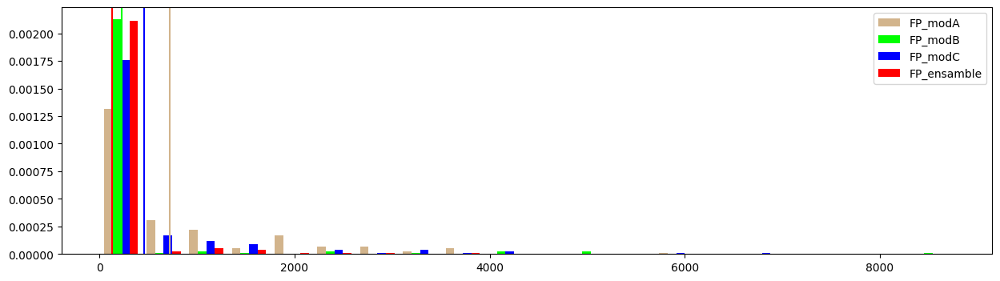

In [103]:
n_bins = 20
med=df_sp_train.mean()
cols=['pred_modA','pred_modB','pred_modC','pred_ensamble']

plt.figure(figsize=(15,4))
colors = ['tan', 'lime','blue','red']
plt.hist(df_sp_train, n_bins, density=True, histtype='bar', color=colors, label=colors)
plt.gca().legend(('FP_modA','FP_modB','FP_modC','FP_ensamble'))#,loc='upper right')
#plt.tick_params(labelrotation=40)

for i in range(4):
  plt.axvline(x=med[cols[i]], color=colors[i])

fname=path_modelo+'Histograma_FP_Train_con_media_A_B_C_Ensamble'
plt.savefig(fname)
plt.show()

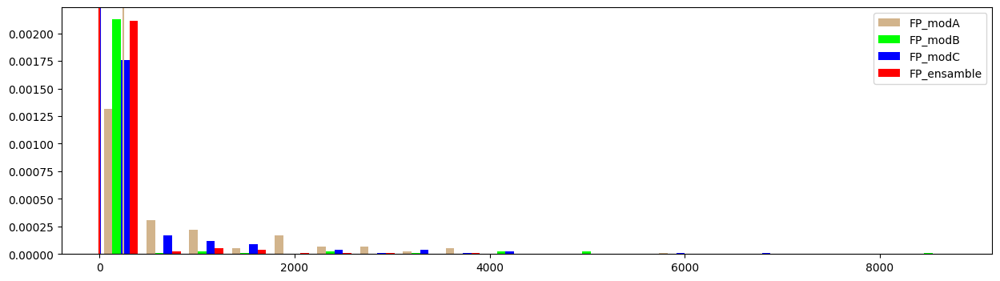

In [104]:
n_bins = 20
med=df_sp_train.median()
cols=['pred_modA','pred_modB','pred_modC','pred_ensamble']

plt.figure(figsize=(15,4))
colors = ['tan', 'lime','blue','red']
plt.hist(df_sp_train, n_bins, density=True, histtype='bar', color=colors, label=colors)
plt.gca().legend(('FP_modA','FP_modB','FP_modC','FP_ensamble'))#,loc='upper right')
#plt.tick_params(labelrotation=40)

for i in range(4):
  plt.axvline(x=med[cols[i]], color=colors[i])

fname=path_modelo+'Histograma_FP_Train_con_mediana_A_B_C_Ensamble'
plt.savefig(fname)
plt.show()